# Otoczka wypukła

In [1]:
import sys
sys.path.insert(0, '../..')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tests.test2 import Test
from visualizer.main import Visualizer

np.random.seed(42)

### Przykładowe zastosowanie narzędzia do wizualizacji

In [2]:
def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points)
    for points in line_segments:
        vis.add_point(points[0], color='red')
    vis.add_line_segment(line_segments, color="red")
    vis.show()

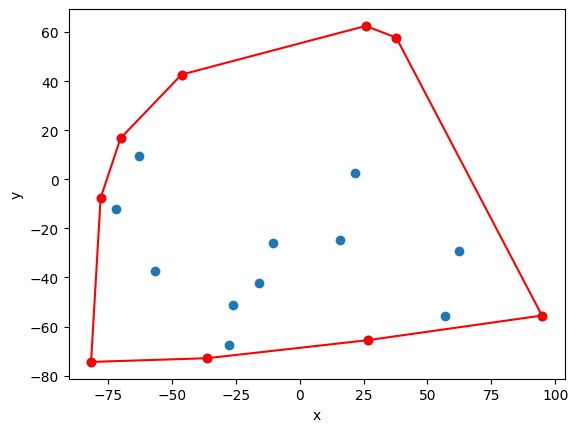

In [3]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [4]:
def generate_uniform_points(left=-100, right=100, n=100):
    """
    Funkcja generuje równomiernie n punktów na kwadwratowym
    obszarze od left do right (jednakowo na osi y)
    o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
             np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    points = np.random.uniform(left, right, size = (n, 2))
    points_list = [tuple(point) for point in points]
    
    return points_list

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [5]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

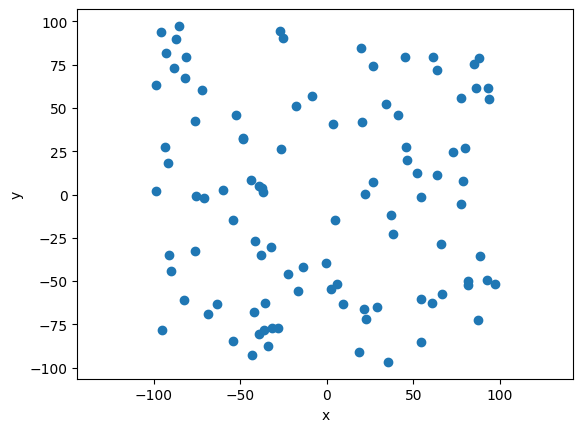

In [6]:
# visualize(points_a)
vis = Visualizer()
vis.add_point(points_a)
vis.axis_equal()
vis.show()

Uzupełnij funkcję ```generate_circle_points```.

In [7]:
def generate_circle_points(O, R, n=100):
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    ts = np.random.uniform(0, 1, size = n)
    points_list = []

    for t in ts:
        x = O[0] + R * np.cos((2 * np.pi) * t)
        y = O[1] + R * np.sin((2 * np.pi) * t)
        points_list.append((x, y))
    
    return points_list

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [8]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

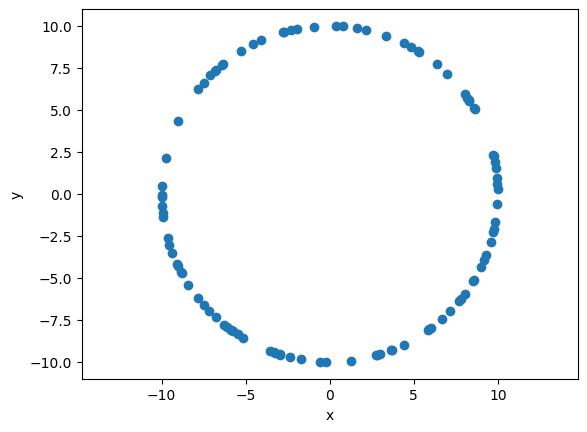

In [9]:
# visualize(points_b)
vis.clear()
vis.add_point(points_b)
vis.axis_equal()
vis.show()

Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [10]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    '''
    Funkcja generuje n punktów na obwodzie prostokąta
    o wierzchołkach w punktach a, b, c i d
    :param a: lewy-dolny wierzchołek prostokąta
    :param b: prawy-dolny wierzchołek prostokąta
    :param c: prawy-górny wierzchołek prostokąta
    :param d: lewy-górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    losowo wybieram prostą wchodzącą w skład prostych wyznaczających kwadrat
    korzystam z równania parametrycznego t należy do [0, 1]
    x = x0 + at
    y = y0 + bt
    gdzie a i b to współrzędne wektora z punktu A(x0, y0) do punktu B(x1, y1)
    '''
    point_list = []
    sides = [(a, b), (b, c), (c, d), (d,a)]
    
    for _ in range(n):
        a, b = sides[np.random.choice(len(sides))]
        t = np.random.uniform(0, 1)
        point_x = a[0] + (b[0] - a[0])*t
        point_y = a[1] + (b[1] - a[1])*t
        point_list.append((point_x, point_y))
        
    return point_list


<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [11]:
points_c = generate_rectangle_points((-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

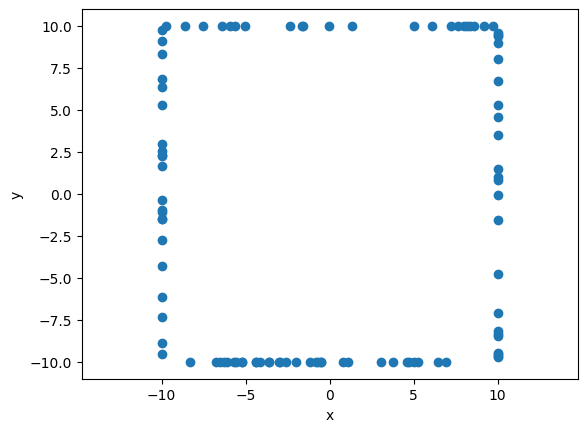

In [12]:
# visualize(points_c)
vis.clear()
vis.add_point(points_c)
vis.axis_equal()
vis.show()

Uzupełnij funkcję ```generate_square_points```.

In [13]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu
    leżących na osiach x i y oraz diag_n punktów na
    przektąnych kwadratu, którego wyznaczają punkty
    a, b, c i d.
    :param a: lewy-dolny wierzchołek kwadratu
    :param b: prawy-dolny wierzchołek kwadratu
    :param c: prawy-górny wierzchołek kwadratu
    :param d: lewy-górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym
                   z dwóch boków kwadratu równoległych do osi x i y
    :param diag_n: ilość generowanych punktów na każdej
                   przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    point_list = []
    point_list.append(a)
    point_list.append(b)
    point_list.append(c)
    point_list.append(d)

    axis = [(a, b), (a, d)]
    diagonals = [(a, c), (b, d)]
    
    for _ in range(axis_n):
        a, b = axis[np.random.choice(len(axis))]
        t = np.random.uniform(0, 1)
        point_x = a[0] + (b[0] - a[0])*t
        point_y = a[1] + (b[1] - a[1])*t
        point_list.append((point_x, point_y))

    for _ in range(diag_n):
        a, b = diagonals[np.random.choice(len(diagonals))]
        t = np.random.uniform(0, 1)
        point_x = a[0] + (b[0] - a[0])*t
        point_y = a[1] + (b[1] - a[1])*t
        point_list.append((point_x, point_y))

    return point_list

<span style="color:red">Ćw.</span> Wygeneruj losowe punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [14]:
points_d = generate_square_points((0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

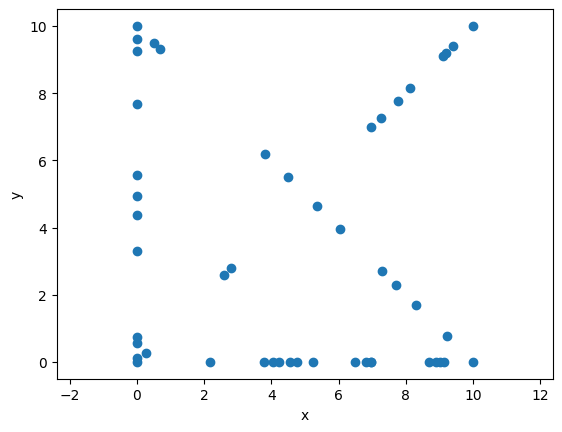

In [15]:
# visualize(points_d)
vis.clear()
vis.add_point(points_d)
vis.axis_equal()
vis.show()

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $x$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [38]:
def mat_det(a, b, c):
    return (b[0] - a[0]) * (c[1] - b[1]) - (b[1] - a[1]) * (c[0] - b[0])

def distance_squared(p0, p1):
    return (p0[0] - p1[0]) ** 2 + (p0[1] - p1[1]) ** 2

def find_p0_with_lowest_y(Q, n):
    p0_x, p0_y = float('inf'), float('inf')
    p0_i = None
    
    for i in range(n):
        if Q[i][1] < p0_y or (Q[i][1] == p0_y and Q[i][0] < p0_x):
            p0_x = Q[i][0]
            p0_y = Q[i][1]
            p0_i = i
    
    return p0_i

In [17]:
def compare(p0, p1, p2, epsilon):
    mat_det_val = -mat_det(p0, p1, p2)
    if abs(mat_det_val) <= epsilon:
        return distance_squared(p0, p1) - distance_squared(p0, p2)
    return mat_det_val

In [21]:
from functools import cmp_to_key

def graham_algorithm(Q, epsilon=1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama oraz
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    n = len(Q)
    p0_i = find_p0_with_lowest_y(Q, n)
    Q[0], Q[p0_i] = Q[p0_i], Q[0]

    Qs = [Q[0]] + sorted(Q[1::], key=cmp_to_key(lambda x, y: compare(Q[0], x, y, epsilon)))

    if n <= 3:
        return Qs
    
    stack = [Qs[0], Qs[1], Qs[2]]

    for i in range(3, n):
        while len(stack) >= 2 and mat_det(stack[-2], stack[-1], Qs[i]) <= 0:
            stack.pop()
        stack.append(Qs[i])

    return stack

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [22]:
Test().runtest(1, graham_algorithm)


Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 1.609s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [23]:
def graham_algorithm_draw(Q, epsilon=1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama oraz
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    vis = Visualizer()
    vis.add_point(Q)

    n = len(Q)
    p0_i = find_p0_with_lowest_y(Q, n)
    Q[0], Q[p0_i] = Q[p0_i], Q[0]

    Qs = [Q[0]] + sorted(Q[1::], key=cmp_to_key(lambda x, y: compare(Q[0], x, y, epsilon)))

    if n <= 3:
        for i in range(n - 1):
            vis.add_point(Qs[i], color = "red")
            vis.add_line_segment([Qs[i], Qs[i + 1]], color="red")
        vis.add_point(Qs[n - 1], color = "red")
        vis.axis_equal()
        return Qs, vis
    
    edges = []
    stack = [Qs[0], Qs[1], Qs[2]]

    vis.add_point(stack[-3], color="red")
    vis.add_point(stack[-2], color="red")
    edge = vis.add_line_segment([stack[-3], stack[-2]], color="red")
    edges.append(edge)
    vis.add_point(stack[-1], color="red")
    edge = vis.add_line_segment([stack[-2], stack[-1]], color="red")
    edges.append(edge)

    for i in range(3, n):
        vis.add_point(Qs[i], color="purple")
        while len(stack) >= 2 and mat_det(stack[-2], stack[-1], Qs[i]) <= 0:
            vis.remove_figure(edges[-1])
            vis.add_point(stack[-1], color="brown")
            stack.pop()
            edges.pop()
        stack.append(Qs[i])
        vis.add_point(Qs[i], color="red")
        edge = vis.add_line_segment([stack[-2], stack[-1]], color="red")
        edges.append(edge)

    vis.add_line_segment([stack[-1], stack[0]], color="red")
    vis.axis_equal()
    return stack, vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [24]:
graham_points_a, vis_graham_a = graham_algorithm_draw(points_a)

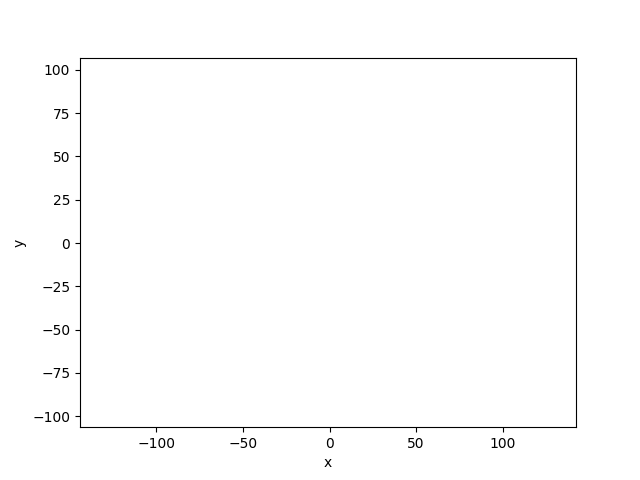

In [26]:
vis_graham_a.show_gif(interval=200)

number of points in the convex hull: 13


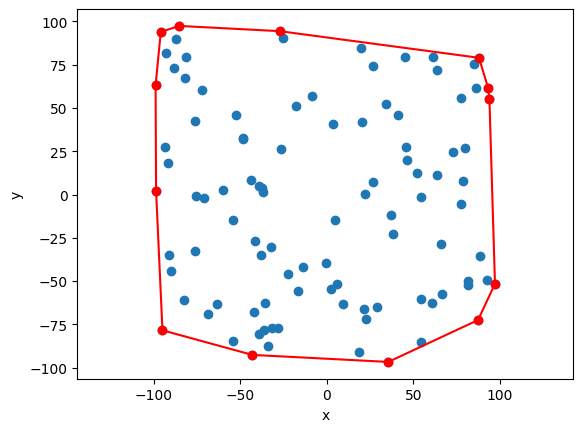

In [27]:
# visualize(graham_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point([point for point in graham_points_a], color='red')
vis.add_line_segment([(graham_points_a[i], graham_points_a[i+1]) for i in range(len(graham_points_a)-1)], color='red')
vis.add_line_segment([graham_points_a[-1], graham_points_a[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(graham_points_a)}")

In [28]:
for point in graham_points_a:
    print(f"({point[0]}, {point[1]})")

(35.51287236845647, -96.68243421442877)
(87.3459977473469, -72.49581117080135)
(97.13009082212014, -51.58894569769992)
(93.91692555291172, 55.02656467222292)
(93.12640661491187, 61.67946962329222)
(87.89978831283781, 78.96547008552977)
(-27.2740795241412, 94.35641654419214)
(-85.08987126404584, 97.37738732010345)
(-95.88310114083951, 93.98197043239887)
(-98.89557657527952, 63.09228569096683)
(-98.60957389376186, 2.149460515513141)
(-94.91617465118097, -78.42171460133912)
(-43.031901124506476, -92.62261052909344)


Zbiór danych B

In [29]:
graham_points_b, vis_graham_b = graham_algorithm_draw(points_b)

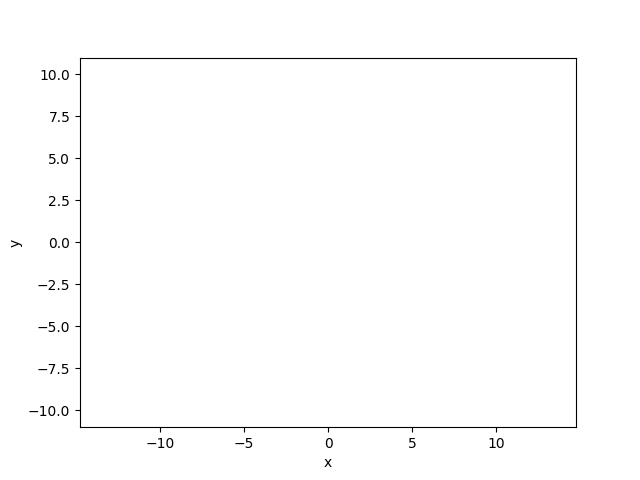

In [31]:
vis_graham_b.show_gif()

number of points in the convex hull: 100


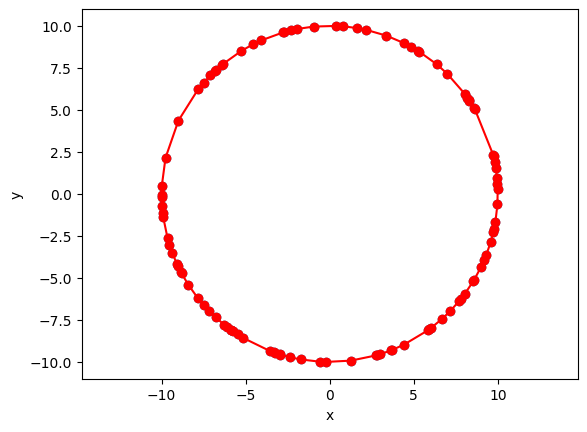

In [27]:
# visualize(graham_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point([point for point in graham_points_b], color='red')
vis.add_line_segment([(graham_points_b[i], graham_points_b[i+1]) for i in range(len(graham_points_b)-1)], color='red')
vis.add_line_segment([graham_points_b[-1], graham_points_b[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(graham_points_b)}")

In [30]:
for point in graham_points_b:
    print(f"({point[0]}, {point[1]})")

(-0.22043366238819118, -9.997570154816927)
(1.252930457957988, -9.92119777383362)
(2.778523717993975, -9.606237866539894)
(2.837703581431476, -9.588922691519157)
(2.9881202271960046, -9.543119904298704)
(3.643894942605213, -9.312466356838888)
(3.6878690614167886, -9.295139686193256)
(4.405064928754686, -8.977494248032436)
(5.838307080119883, -8.118754241767764)
(5.935481455105013, -8.047984834485243)
(6.0297693795447005, -7.977586178130896)
(6.710225481019735, -7.414369426584669)
(7.175710702264797, -6.964852899911271)
(7.705346366045066, -6.373981281685419)
(7.786458772759062, -6.274636226915744)
(8.036440677789598, -5.951102522421259)
(8.55062126422714, -5.185255634561007)
(8.603079800750693, -5.097746359119429)
(9.002783748878977, -4.3531465368076665)
(9.206120131731574, -3.9047857969582167)
(9.308333279982886, -3.654439977447028)
(9.58393786140004, -2.854493837587114)
(9.739885917378169, -2.265970502115687)
(9.781321209088226, -2.079845043420506)
(9.856557895876971, -1.687680788900

Zbiór danych C

In [31]:
graham_points_c, vis_graham_c = graham_algorithm_draw(points_c)

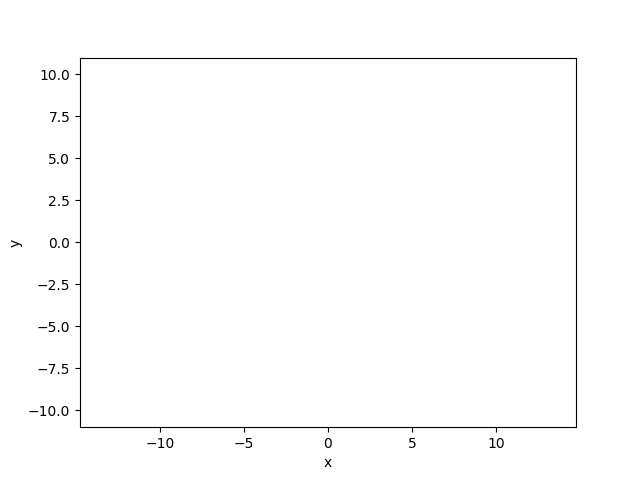

In [23]:
vis_graham_c.show_gif()

number of points in the convex hull: 8


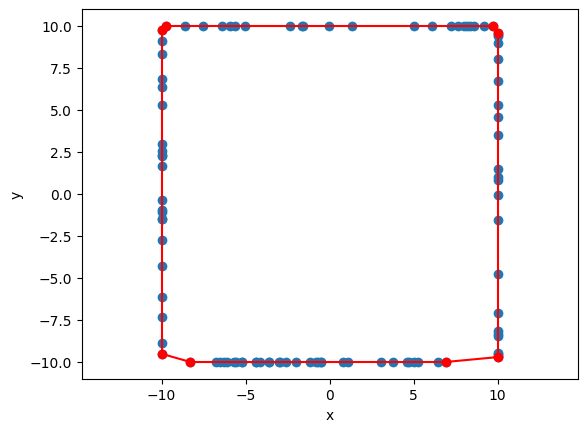

In [32]:
# visualize(graham_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point([point for point in graham_points_c], color='red')
vis.add_line_segment([(graham_points_c[i], graham_points_c[i+1]) for i in range(len(graham_points_c)-1)], color='red')
vis.add_line_segment([graham_points_c[-1], graham_points_c[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(graham_points_c)}")

In [33]:
for point in graham_points_c:
    print(f"({point[0]}, {point[1]})")

(-8.30324571829616, -10.0)
(6.942862881911797, -10.0)
(10.0, -9.712130227404883)
(10.0, 9.59021057243017)
(9.693909194192305, 10.0)
(-9.720021276457416, 10.0)
(-10.0, 9.783246970394032)
(-10.0, -9.517041589250692)


Zbiór danych D

In [34]:
graham_points_d, vis_graham_d = graham_algorithm_draw(points_d)

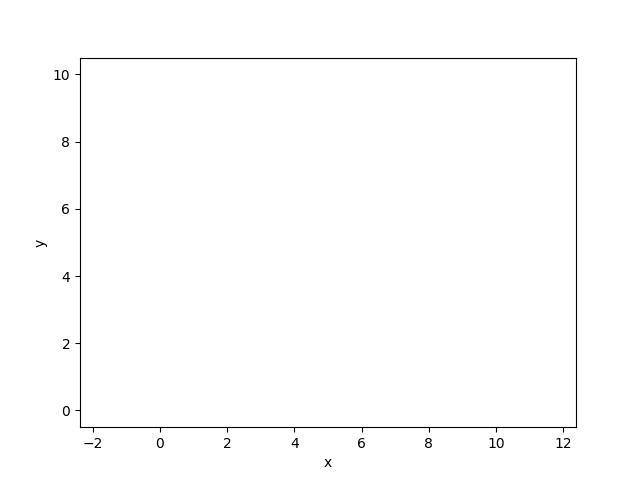

In [27]:
vis_graham_d.show_gif()

number of points in the convex hull: 4


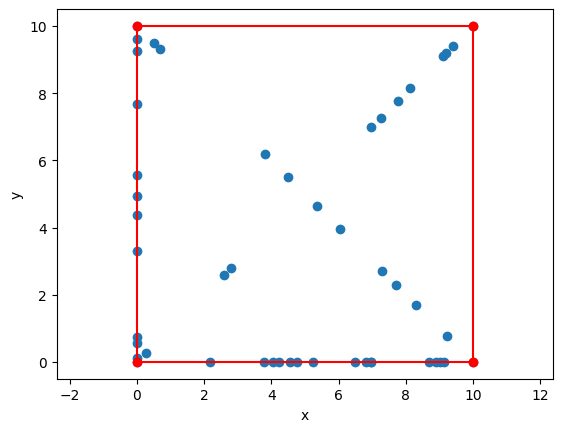

In [35]:
# visualize(graham_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point([point for point in graham_points_d], color='red')
vis.add_line_segment([(graham_points_d[i], graham_points_d[i+1]) for i in range(len(graham_points_d)-1)], color='red')
vis.add_line_segment([graham_points_d[-1], graham_points_d[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(graham_points_d)}")

In [36]:
for point in graham_points_d:
    print(f"({point[0]}, {point[1]})")

(0, 0)
(10, 0)
(10, 10)
(0, 10)


### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

In [37]:
def mat_det(a, b, c):
    return (b[0] - a[0]) * (c[1] - b[1]) - (b[1] - a[1]) * (c[0] - b[0])

def distance_squared(p0, p1):
    return (p0[0] - p1[0]) ** 2 + (p0[1] - p1[1]) ** 2

def find_p0_with_lowest_y(Q, n):
    p0_x, p0_y = float('inf'), float('inf')
    p0_i = None
    
    for i in range(n):
        if Q[i][1] < p0_y or (Q[i][1] == p0_y and Q[i][0] < p0_x):
            p0_x = Q[i][0]
            p0_y = Q[i][1]
            p0_i = i
    
    return p0_i

In [39]:
def compare(p0, p1, p2, epsilon):
    mat_det_val = -mat_det(p0, p1, p2)
    if abs(mat_det_val) <= epsilon:
        return distance_squared(p0, p1) - distance_squared(p0, p2)
    return mat_det_val

In [40]:
from functools import cmp_to_key

def find_p_next_i(current_i, Q, n, epsilon):
    next_i = None
    distance_squared_from_current_to_next = 0

    for i in range(n):
        if current_i == i:
            continue

        if next_i is None:
            next_i = i
            distance_squared_from_current_to_next = distance_squared(Q[current_i], Q[next_i])
            continue

        mat_det_val = mat_det(Q[current_i], Q[next_i], Q[i])
        if mat_det_val < -epsilon:
            next_i = i
            distance_squared_from_current_to_next = distance_squared(Q[current_i], Q[i])
        if abs(mat_det_val) <= epsilon and distance_squared_from_current_to_next < (distance_Squared_from_current_to_i := distance_squared(Q[current_i], Q[i])):
            distance_squared_from_current_to_next = distance_Squared_from_current_to_i
            next_i = i
    
    return next_i

def jarvis_algorithm(Q, epsilon=1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    n = len(Q)
    p0_i = find_p0_with_lowest_y(Q, n)

    if n < 3:
        return sorted(Q, key = cmp_to_key(lambda p1, p2: compare(Q[p0_i], p1, p2, epsilon)))

    stack = [Q[p0_i]]
    current_i = p0_i
    
    while (next_i := find_p_next_i(current_i, Q, n, epsilon)) != p0_i:
        stack.append(Q[next_i])
        current_i = next_i
    return stack

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [41]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 1.328s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [1]:
from functools import cmp_to_key

def find_p_next_i_draw(current_i, Q, n, epsilon, vis):
    next_i = None
    distance_squared_from_current_to_next = 0
    for i in range(n):
        if i == current_i:
            continue

        if next_i is None:
            next_i = i
            distance_squared_from_current_to_next = distance_squared(Q[current_i], Q[next_i])
            point = vis.add_point(Q[next_i], color='purple')
            edge = vis.add_line_segment([Q[current_i], Q[next_i]], color="purple")
            continue

        mat_det_val = mat_det(Q[current_i], Q[next_i], Q[i])
        if mat_det_val < -epsilon:
            next_i = i
            distance_squared_from_current_to_next = distance_squared(Q[current_i], Q[i])
            vis.remove_figure(edge)
            vis.remove_figure(point)
            point = vis.add_point(Q[next_i], color='purple')
            edge = vis.add_line_segment([Q[current_i], Q[next_i]], color="purple")
        if abs(mat_det_val) <= epsilon and distance_squared_from_current_to_next < (distance_Squared_from_current_to_i := distance_squared(Q[current_i], Q[i])):
            next_i = i
            distance_squared_from_current_to_next = distance_Squared_from_current_to_i
            vis.remove_figure(edge)
            vis.remove_figure(point)
            point = vis.add_point(Q[next_i], color='purple')
            edge = vis.add_line_segment([Q[current_i], Q[next_i]], color="purple")
    
    return next_i

def jarvis_algorithm_draw(Q, epsilon=1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    vis = Visualizer()
    vis.add_point(Q)
    n = len(Q)
    p0_i = find_p0_with_lowest_y(Q, n)

    if n < 3:
        Qs = sorted(Q, key = cmp_to_key(lambda p1, p2: compare(Q[p0_i], p1, p2, epsilon)))
        for i in range(n - 1):
            vis.add_point(Qs[i], color ="red")
            vis.add_line_segment([Qs[i], Qs[i + 1]], color="red")
        vis.add_point(Qs[n - 1], color = "red")
        vis.axis_equal()
        return Qs, vis
    
    if n < 3:

        return sorted(Q, key = cmp_to_key(lambda p1, p2: compare(Q[p0_i], p1, p2, epsilon)))

    stack = [Q[p0_i]]
    current_i = p0_i
    vis.add_point(Q[p0_i], color='red')

    while (next_i := find_p_next_i_draw(current_i, Q, n, epsilon, vis)) != p0_i:
        stack.append(Q[next_i])
        vis.add_point(Q[next_i], color='red')
        vis.add_line_segment([stack[-2], stack[-1]], color="red")
        current_i = next_i

    vis.add_point(Q[0], color='red')
    vis.add_line_segment([stack[-1], stack[0]], color="red")
    vis.axis_equal()
    return stack, vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [43]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)

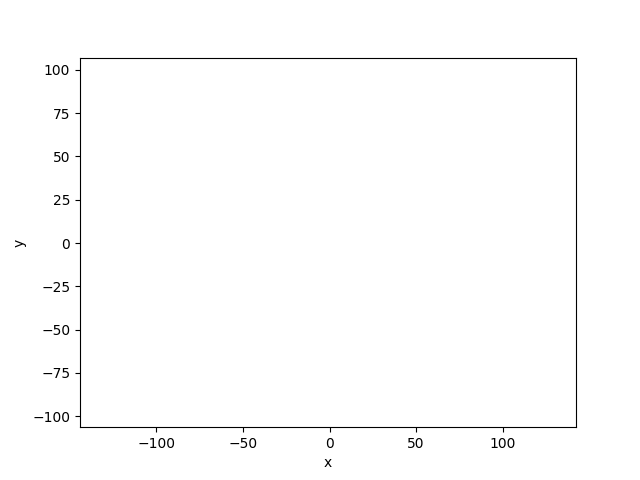

In [25]:
vis_jarvis_a.show_gif()

number of points in the convex hull: 13


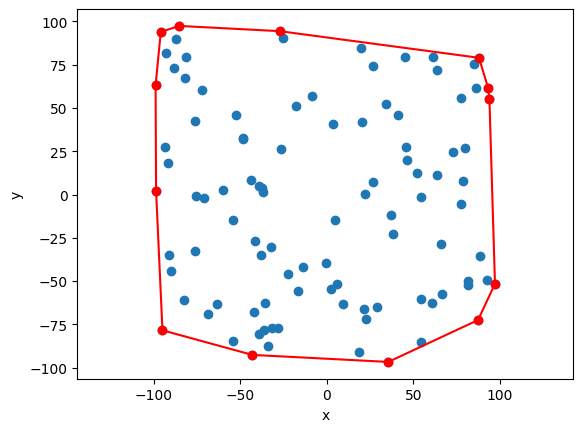

In [44]:
# visualize(jarvis_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point([point for point in jarvis_points_a], color='red')
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)], color='red')
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(jarvis_points_a)}")

In [45]:
for point in jarvis_points_a:
    print(f"({point[0]}, {point[1]})")

(35.51287236845647, -96.68243421442877)
(87.3459977473469, -72.49581117080135)
(97.13009082212014, -51.58894569769992)
(93.91692555291172, 55.02656467222292)
(93.12640661491187, 61.67946962329222)
(87.89978831283781, 78.96547008552977)
(-27.2740795241412, 94.35641654419214)
(-85.08987126404584, 97.37738732010345)
(-95.88310114083951, 93.98197043239887)
(-98.89557657527952, 63.09228569096683)
(-98.60957389376186, 2.149460515513141)
(-94.91617465118097, -78.42171460133912)
(-43.031901124506476, -92.62261052909344)


Zbiór danych B

In [46]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)

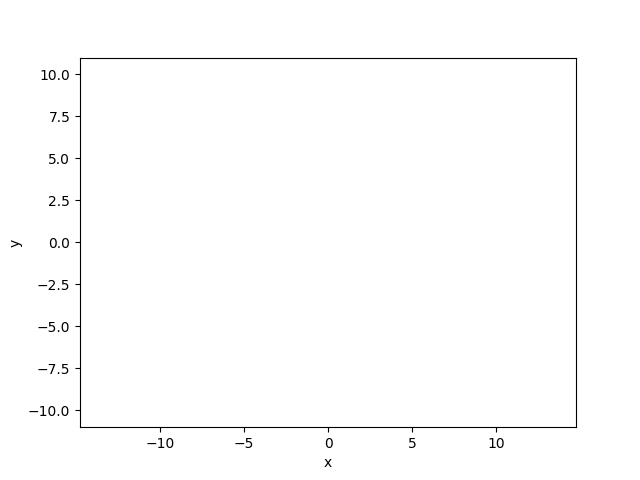

In [28]:
vis_jarvis_b.show_gif()

number of points in the convex hull: 100


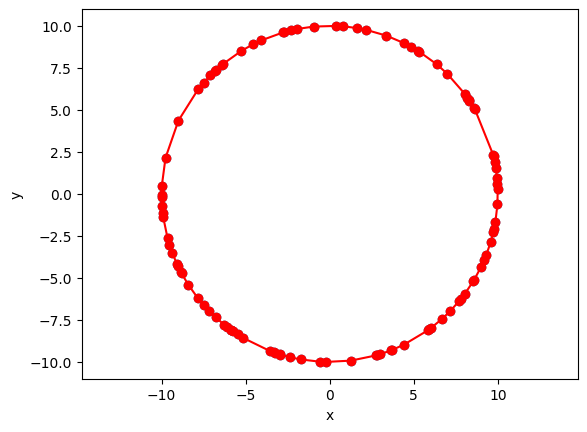

In [47]:
# visualize(jarvis_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point([point for point in jarvis_points_b], color='red')
vis.add_line_segment([(jarvis_points_b[i], jarvis_points_b[i+1]) for i in range(len(jarvis_points_b)-1)], color='red')
vis.add_line_segment([jarvis_points_b[-1], jarvis_points_b[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(jarvis_points_b)}")

In [48]:
for point in jarvis_points_b:
    print(f"({point[0]}, {point[1]})")

(-0.22043366238819118, -9.997570154816927)
(1.252930457957988, -9.92119777383362)
(2.778523717993975, -9.606237866539894)
(2.837703581431476, -9.588922691519157)
(2.9881202271960046, -9.543119904298704)
(3.643894942605213, -9.312466356838888)
(3.6878690614167886, -9.295139686193256)
(4.405064928754686, -8.977494248032436)
(5.838307080119883, -8.118754241767764)
(5.935481455105013, -8.047984834485243)
(6.0297693795447005, -7.977586178130896)
(6.710225481019735, -7.414369426584669)
(7.175710702264797, -6.964852899911271)
(7.705346366045066, -6.373981281685419)
(7.786458772759062, -6.274636226915744)
(8.036440677789598, -5.951102522421259)
(8.55062126422714, -5.185255634561007)
(8.603079800750693, -5.097746359119429)
(9.002783748878977, -4.3531465368076665)
(9.206120131731574, -3.9047857969582167)
(9.308333279982886, -3.654439977447028)
(9.58393786140004, -2.854493837587114)
(9.739885917378169, -2.265970502115687)
(9.781321209088226, -2.079845043420506)
(9.856557895876971, -1.687680788900

Zbiór danych C

In [49]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)

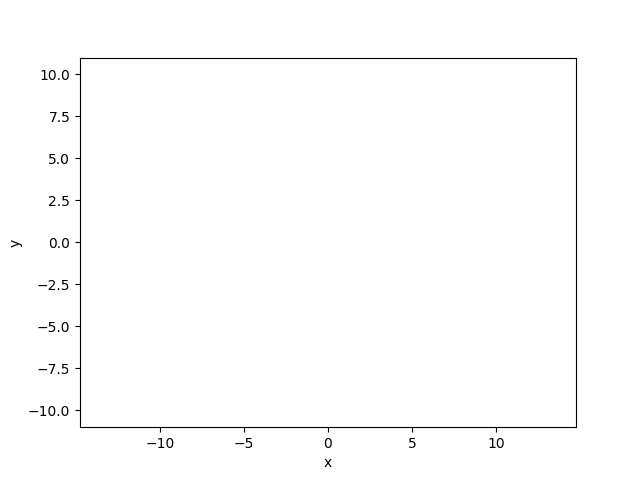

In [33]:
vis_jarvis_c.show_gif()

number of points in the convex hull: 8


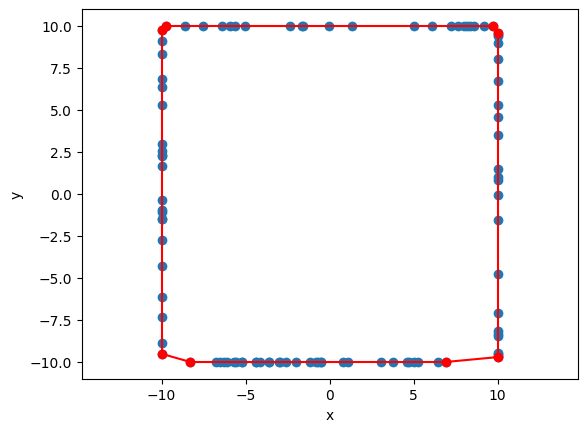

In [50]:
# visualize(jarvis_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point([point for point in jarvis_points_c], color='red')
vis.add_line_segment([(jarvis_points_c[i], jarvis_points_c[i+1]) for i in range(len(jarvis_points_c)-1)], color='red')
vis.add_line_segment([jarvis_points_c[-1], jarvis_points_c[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(jarvis_points_c)}")

In [51]:
for point in jarvis_points_c:
    print(f"({point[0]}, {point[1]})")

(-8.30324571829616, -10.0)
(6.942862881911797, -10.0)
(10.0, -9.712130227404883)
(10.0, 9.59021057243017)
(9.693909194192305, 10.0)
(-9.720021276457416, 10.0)
(-10.0, 9.783246970394032)
(-10.0, -9.517041589250692)


Zbiór danych D

In [52]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)

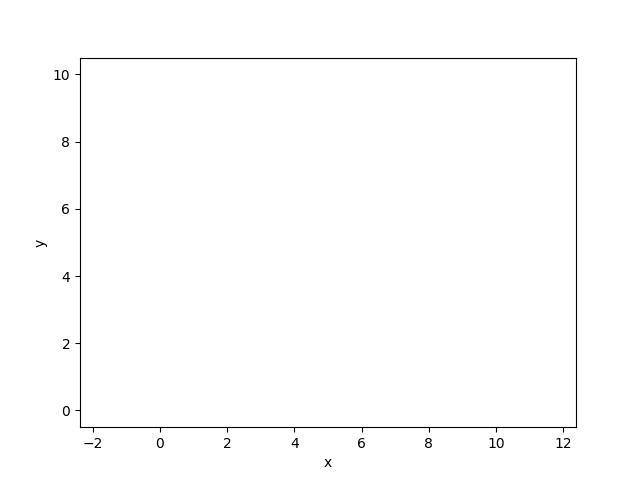

In [41]:
vis_jarvis_d.show_gif()

number of points in the convex hull: 4


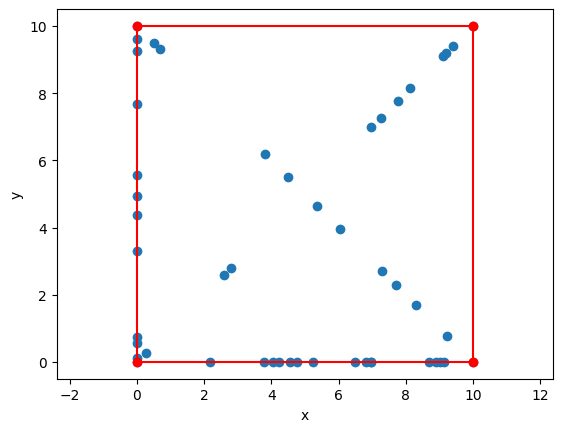

In [53]:
# visualize(jarvis_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point([point for point in jarvis_points_d], color='red')
vis.add_line_segment([(jarvis_points_d[i], jarvis_points_d[i+1]) for i in range(len(jarvis_points_d)-1)], color='red')
vis.add_line_segment([jarvis_points_d[-1], jarvis_points_d[0]], color='red')
vis.axis_equal()
vis.show()

print(f"number of points in the convex hull: {len(jarvis_points_d)}")

In [54]:
for point in jarvis_points_d:
    print(f"({point[0]}, {point[1]})")

(0, 0)
(10, 0)
(10, 10)
(0, 10)



---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [55]:
# prepare your data to time-test
ns = [1000, 2500, 5000, 7500, 10000, 25000, 50000, 75000, 100000]
ns_b = [1000, 2500, 5000, 7500, 10000, 25000, 50000]

points_a_test_set = [generate_uniform_points(-1000, 1000, n) for n in ns]
points_b_test_set = [generate_circle_points((0, 0), 1000, n) for n in ns_b]
points_c_test_set = [generate_rectangle_points((-1000, -1000), (-1000, 1000), (1000, 1000), (1000, -1000), n) for n in ns]
points_d_test_set = [generate_square_points((-1000, -1000), (-1000, 1000), (1000, 1000), (1000, -1000), n//2, n//2) for n in ns]

Po przygotowaniu zbioru danych, dokonaj porównania czasowego  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

In [31]:
import time

In [50]:
# compare your sets of data
print(f"zbior A")
for i in range(len(ns)):
    start_graham = time.time()
    res_graham = graham_algorithm(points_a_test_set[i])
    end_graham = time.time()

    start_jarvis = time.time()
    res_jarvis = jarvis_algorithm(points_a_test_set[i])
    end_jarvis = time.time()
    print()
    print(f"n = {ns[i]}")
    print("liczba punktów w otoczce")
    print(f"graham: {len(res_graham)}   jarvis: {len(res_jarvis)}")
    print("czas działania")
    print("graham: %.4fs   jarvis: %.4fs" % (end_graham - start_graham, end_jarvis - start_jarvis))


zbior A

n = 1000
liczba punktów w otoczce
graham: 20   jarvis: 20
czas działania
graham: 0.0072s   jarvis: 0.0095s

n = 2500
liczba punktów w otoczce
graham: 23   jarvis: 23
czas działania
graham: 0.0167s   jarvis: 0.0274s

n = 5000
liczba punktów w otoczce
graham: 21   jarvis: 21
czas działania
graham: 0.0352s   jarvis: 0.0491s

n = 7500
liczba punktów w otoczce
graham: 32   jarvis: 32
czas działania
graham: 0.0552s   jarvis: 0.1132s

n = 10000
liczba punktów w otoczce
graham: 25   jarvis: 25
czas działania
graham: 0.0779s   jarvis: 0.1199s

n = 25000
liczba punktów w otoczce
graham: 24   jarvis: 24
czas działania
graham: 0.2318s   jarvis: 0.2803s

n = 50000
liczba punktów w otoczce
graham: 30   jarvis: 30
czas działania
graham: 0.4877s   jarvis: 0.7151s

n = 75000
liczba punktów w otoczce
graham: 30   jarvis: 30
czas działania
graham: 0.8120s   jarvis: 1.1303s

n = 100000
liczba punktów w otoczce
graham: 31   jarvis: 31
czas działania
graham: 1.0960s   jarvis: 1.7521s


In [32]:
print(f"zbior B")
for i in range(len(ns_b)):
    start_graham = time.time()
    res_graham = graham_algorithm(points_b_test_set[i])
    end_graham = time.time()

    start_jarvis = time.time()
    res_jarvis = jarvis_algorithm(points_b_test_set[i])
    end_jarvis = time.time()
    print()
    print(f"n = {ns[i]}")
    print("liczba punktów w otoczce")
    print(f"graham: {len(res_graham)}   jarvis: {len(res_jarvis)}")
    print("czas działania")
    print("graham: %.4fs   jarvis: %.4fs" % (end_graham - start_graham, end_jarvis - start_jarvis))

zbior B

n = 1000
liczba punktów w otoczce
graham: 1000   jarvis: 1000
czas działania
graham: 0.0063s   jarvis: 0.5741s

n = 2500
liczba punktów w otoczce
graham: 2500   jarvis: 2500
czas działania
graham: 0.0230s   jarvis: 3.6144s

n = 5000
liczba punktów w otoczce
graham: 5000   jarvis: 5000
czas działania
graham: 0.0413s   jarvis: 12.6993s

n = 7500
liczba punktów w otoczce
graham: 7500   jarvis: 7500
czas działania
graham: 0.0543s   jarvis: 27.4761s

n = 10000
liczba punktów w otoczce
graham: 10000   jarvis: 10000
czas działania
graham: 0.0771s   jarvis: 53.0345s

n = 25000
liczba punktów w otoczce
graham: 25000   jarvis: 25000
czas działania
graham: 0.2460s   jarvis: 324.9681s

n = 50000
liczba punktów w otoczce
graham: 50000   jarvis: 50000
czas działania
graham: 0.5023s   jarvis: 1306.8397s


In [67]:
# compare your sets of data
print(f"zbior C")
for i in range(len(ns)):
    start_graham = time.time()
    res_graham = graham_algorithm(points_c_test_set[i])
    end_graham = time.time()

    start_jarvis = time.time()
    res_jarvis = jarvis_algorithm(points_c_test_set[i])
    end_jarvis = time.time()
    print()
    print(f"n = {ns[i]}")
    print("liczba punktów w otoczce")
    print(f"graham: {len(res_graham)}   jarvis: {len(res_jarvis)}")
    print("czas działania")
    print("graham: %.4fs   jarvis: %.4fs" % (end_graham - start_graham, end_jarvis - start_jarvis))

zbior C

n = 1000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.0039s   jarvis: 0.0024s

n = 2500
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.0113s   jarvis: 0.0049s

n = 5000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.0220s   jarvis: 0.0096s

n = 7500
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.0348s   jarvis: 0.0145s

n = 10000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.0493s   jarvis: 0.0199s

n = 25000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.1439s   jarvis: 0.0484s

n = 50000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.3221s   jarvis: 0.0987s

n = 75000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.5145s   jarvis: 0.1549s

n = 100000
liczba punktów w otoczce
graham: 8   jarvis: 8
czas działania
graham: 0.7398s   jarvis: 0.2073s


In [68]:
# compare your sets of data
print(f"zbior D")
for i in range(len(ns)):
    start_graham = time.time()
    res_graham = graham_algorithm(points_d_test_set[i])
    end_graham = time.time()

    start_jarvis = time.time()
    res_jarvis = jarvis_algorithm(points_d_test_set[i])
    end_jarvis = time.time()
    print()
    print(f"n = {ns[i]}")
    print("liczba punktów w otoczce")
    print(f"graham: {len(res_graham)}   jarvis: {len(res_jarvis)}")
    print("czas działania")
    print("graham: %.4fs   jarvis: %.4fs" % (end_graham - start_graham, end_jarvis - start_jarvis))

zbior D

n = 1000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.0057s   jarvis: 0.0016s

n = 2500
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.0158s   jarvis: 0.0033s

n = 5000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.0346s   jarvis: 0.0070s

n = 7500
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.0547s   jarvis: 0.0102s

n = 10000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.0804s   jarvis: 0.0142s

n = 25000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.2186s   jarvis: 0.0349s

n = 50000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.4941s   jarvis: 0.0715s

n = 75000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 0.7724s   jarvis: 0.1053s

n = 100000
liczba punktów w otoczce
graham: 4   jarvis: 4
czas działania
graham: 1.0831s   jarvis: 0.1407s


WNIOSKI HERE  
W sprawozdaniu napisz, czy Twój program działał poprawnie dla wszystkich zbiorów
danych oraz opisz krótko wnioski dotyczące działania algorytmu dla poszczególnych
zbiorów. Napisz, dlaczego wg Ciebie zaproponowano takie zbiory punktów? Które ze
zbiorów mogły stwarzać problemy w działaniu algorytmów? Jeśli tak, to jakie i
dlaczego? Porównaj czasy działania obu algorytmów w zależności od liczby punktów
w poszczególnych zbiorach (A, B, C, D). Dołącz wybrane, istotne ilustracje.

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
